In [1]:
from numpy.random import seed
seed(101)
from tensorflow import set_random_seed
set_random_seed(101)

import pandas as pd
import numpy as np

import tensorflow

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.metrics import binary_accuracy

import os
import cv2

import imageio
import skimage
import skimage.io
import skimage.transform

from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
import itertools
import shutil
import matplotlib.pyplot as plt
%matplotlib inline

C:\Users\dell\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
# Total number of images we want to have in each class
NUM_AUG_IMAGES_WANTED = 1000 

# We will resize the images
IMAGE_HEIGHT = 96
IMAGE_WIDTH = 96

In [3]:
import os, shutil

In [4]:
orgpath = os.getcwd()
orgpath

'C:\\Users\\dell\\Hackathon_Dec_1819'

In [5]:
os.listdir('C:\\Users\\dell\\Hackathon_Dec_1819')

['.ipynb_checkpoints',
 'aug_dir',
 'base_dir',
 'ChinaSet_AllFiles',
 'MIP_J_Comp.ipynb',
 'model.h5',
 'MontgomerySet',
 'TB_CNN_plot.png',
 'TB_VGG16_plot.png',
 'VGG16.ipynb']

In [6]:
print(len(os.listdir('C:\\Users\\dell\\Hackathon_Dec_1819\\ChinaSet_AllFiles\\CXR_png')))
print(len(os.listdir('C:\\Users\\dell\\Hackathon_Dec_1819\\MontgomerySet\\CXR_png')))

663
138


In [7]:
shen_image_list = os.listdir('C:\\Users\\dell\\Hackathon_Dec_1819\\ChinaSet_AllFiles\\CXR_png')
mont_image_list = os.listdir('C:\\Users\\dell\\Hackathon_Dec_1819\\MontgomerySet\\CXR_png')

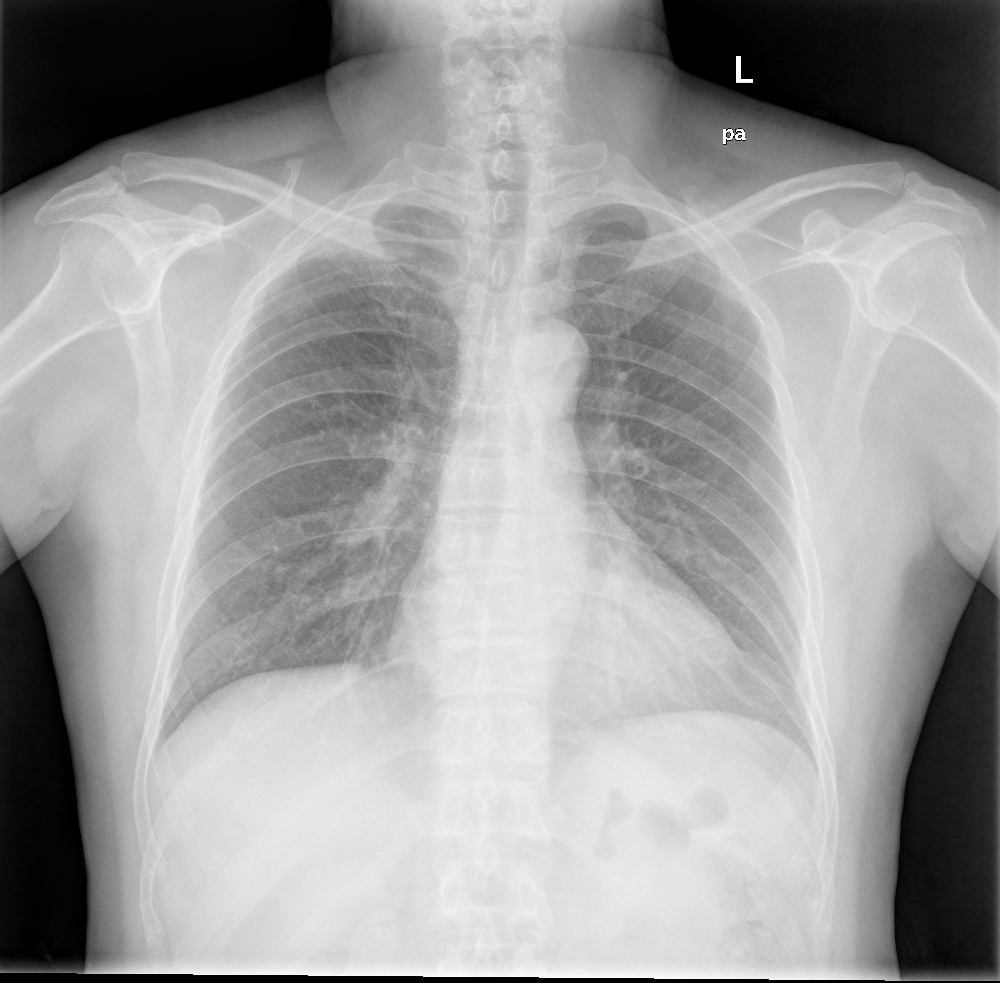

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

In [8]:
from IPython.display import Image, display
display(Image('C:\\Users\\dell\\Hackathon_Dec_1819\\ChinaSet_AllFiles\\CXR_png\\CHNCXR_0002_0.png'))
plt.figure(figsize=(5,5))

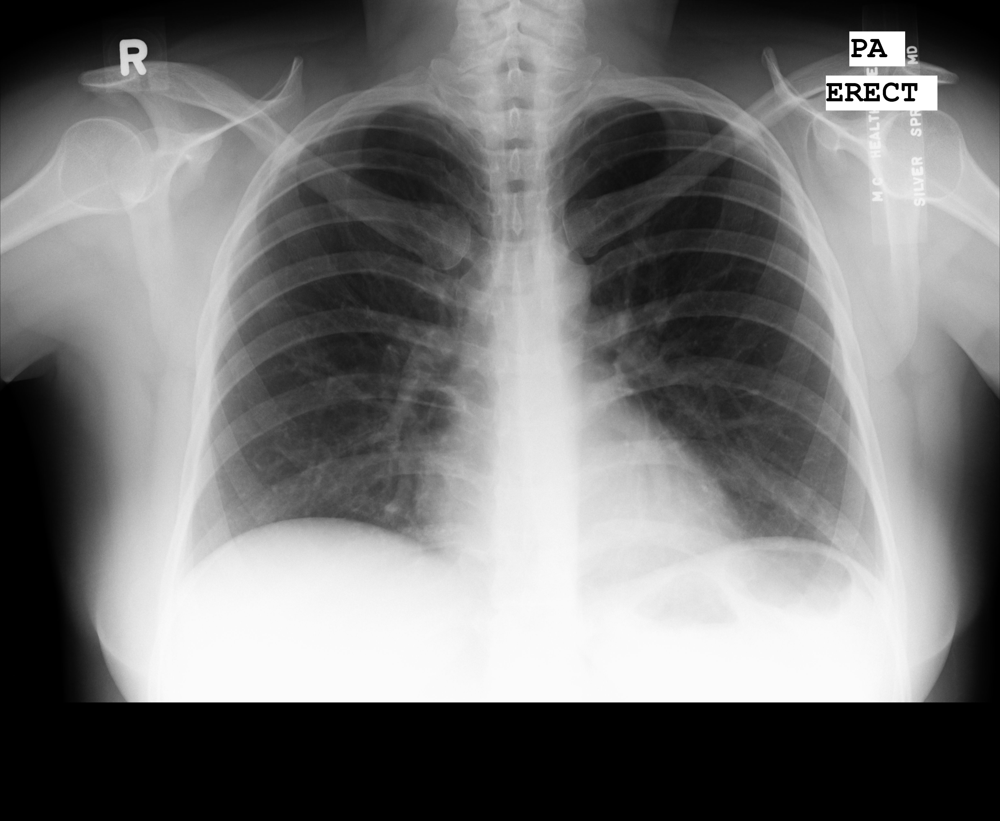

<Figure size 360x360 with 0 Axes>

<Figure size 360x360 with 0 Axes>

In [9]:
display(Image('C:\\Users\\dell\\Hackathon_Dec_1819\\MontgomerySet\\CXR_png\\MCUCXR_0001_0.png'))
plt.figure(figsize=(5,5))

In [10]:
# put the images into dataframes
df_shen = pd.DataFrame(shen_image_list, columns=['image_id'])
df_mont = pd.DataFrame(mont_image_list, columns=['image_id'])

# remove the 'Thunbs.db' line
df_shen = df_shen[df_shen['image_id'] != 'Thumbs.db']
df_mont = df_mont[df_mont['image_id'] != 'Thumbs.db']

# Reset the index or this will cause an error later
df_shen.reset_index(inplace=True, drop=True)
df_mont.reset_index(inplace=True, drop=True)

print(df_shen.shape)
print(df_mont.shape)

(662, 1)
(138, 1)


In [11]:
df_shen.head()

,image_id
0,CHNCXR_0001_0.png
1,CHNCXR_0002_0.png
2,CHNCXR_0003_0.png
3,CHNCXR_0004_0.png
4,CHNCXR_0005_0.png


In [12]:
df_mont.head()

,image_id
0,MCUCXR_0001_0.png
1,MCUCXR_0002_0.png
2,MCUCXR_0003_0.png
3,MCUCXR_0004_0.png
4,MCUCXR_0005_0.png


In [13]:
# example: CHNCXR_0470_1.png --> 1 is the label, meaning TB is present.

def extract_target(x):
    target = int(x[-5])
    if target == 0:
        return 'Normal'
    if target == 1:
        return 'Tuberculosis'

In [14]:
# Assign the target labels

df_shen['target'] = df_shen['image_id'].apply(extract_target)

df_mont['target'] = df_mont['image_id'].apply(extract_target)

In [15]:
# Shenzen Dataset

df_shen['target'].value_counts()

Tuberculosis    336
Normal          326
Name: target, dtype: int64

In [16]:
# Montary Dataset

df_mont['target'].value_counts()

Normal          80
Tuberculosis    58
Name: target, dtype: int64

In [17]:

def draw_category_images(col_name,figure_cols, df, IMAGE_PATH):
    
    """
    Give a column in a dataframe,
    this function takes a sample of each class and displays that
    sample on one row. The sample size is the same as figure_cols which
    is the number of columns in the figure.
    Because this function takes a random sample, each time the function is run it
    displays different images.
    """
    

    categories = (df.groupby([col_name])[col_name].nunique()).index
    f, ax = plt.subplots(nrows=len(categories),ncols=figure_cols, 
                         figsize=(4*figure_cols,4*len(categories))) # adjust size here
    # draw a number of images for each location
    for i, cat in enumerate(categories):
        sample = df[df[col_name]==cat].sample(figure_cols) # figure_cols is also the sample size
        for j in range(0,figure_cols):
            file=IMAGE_PATH + sample.iloc[j]['image_id']
            im=imageio.imread(file)
            ax[i, j].imshow(im, resample=True, cmap='gray')
            ax[i, j].set_title(cat, fontsize=14)  
    plt.tight_layout()
    plt.show()

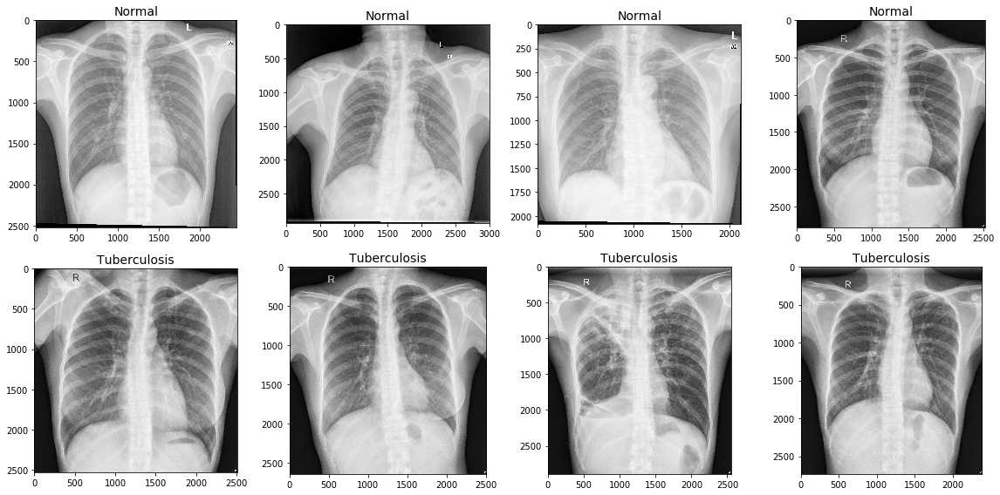

,image_id,target
280,CHNCXR_0281_0.png,Normal
456,CHNCXR_0457_1.png,Tuberculosis
355,CHNCXR_0356_1.png,Tuberculosis
276,CHNCXR_0277_0.png,Normal
509,CHNCXR_0510_1.png,Tuberculosis


In [18]:
# Shenzen Dataset

IMAGE_PATH = 'C:/Users/dell/Hackathon_Dec_1819/ChinaSet_AllFiles/CXR_png/' 

draw_category_images('target',4, df_shen, IMAGE_PATH)
df_shen.sample(5)


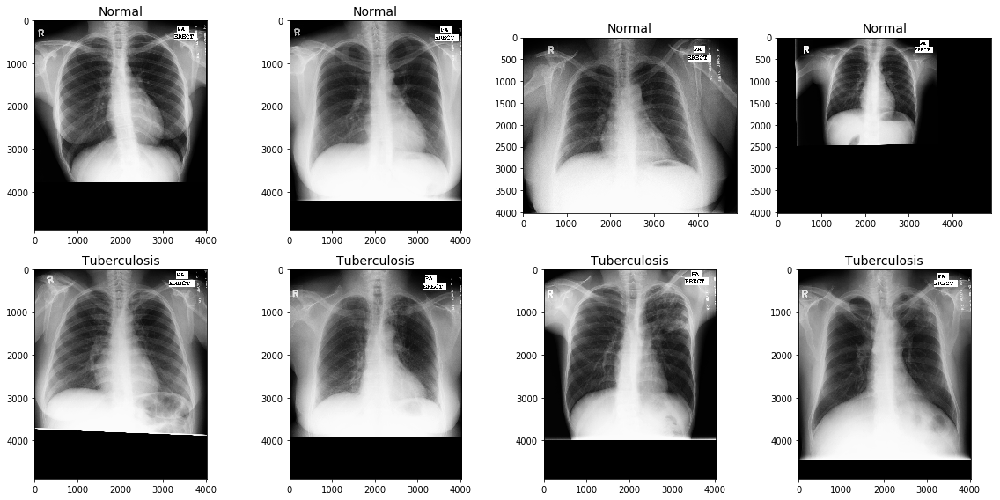

,image_id,target
78,MCUCXR_0102_0.png,Normal
11,MCUCXR_0017_0.png,Normal
32,MCUCXR_0046_0.png,Normal
104,MCUCXR_0243_1.png,Tuberculosis
61,MCUCXR_0082_0.png,Normal


In [19]:
# Montgomary

IMAGE_PATH = 'C:/Users/dell/Hackathon_Dec_1819/MontgomerySet/CXR_png/' 

draw_category_images('target',4, df_mont, IMAGE_PATH)

df_mont.sample(5)


In [20]:
def read_image_sizes(file_name):
    """
    1. Get the shape of the image
    2. Get the min and max pixel values in the image.
    Getting pixel values will tell if any pre-processing has been done.
    3. This info will be added to the original dataframe.
    """
    image = cv2.imread(IMAGE_PATH + file_name)
    max_pixel_val = image.max()
    min_pixel_val = image.min()
    
    # image.shape[2] represents the number of channels: (height, width, num_channels).
    # Here we are saying: If the shape does not have a value for num_channels (height, width)
    # then assign 1 to the number of channels.
    if len(image.shape) > 2: # i.e. more than two numbers in the tuple
        output = [image.shape[0], image.shape[1], image.shape[2], max_pixel_val, min_pixel_val]
    else:
        output = [image.shape[0], image.shape[1], 1, max_pixel_val, min_pixel_val]
    return output

In [21]:
IMAGE_PATH = 'C:/Users/dell/Hackathon_Dec_1819/ChinaSet_AllFiles/CXR_png/'

m = np.stack(df_shen['image_id'].apply(read_image_sizes))
df = pd.DataFrame(m,columns=['w','h','c','max_pixel_val','min_pixel_val'])
df_shen = pd.concat([df_shen,df],axis=1, sort=False)

df_shen.head()

,image_id,target,w,h,c,max_pixel_val,min_pixel_val
0,CHNCXR_0001_0.png,Normal,2919,3000,3,255,0
1,CHNCXR_0002_0.png,Normal,2951,3000,3,255,0
2,CHNCXR_0003_0.png,Normal,2945,2987,3,255,0
3,CHNCXR_0004_0.png,Normal,2933,3000,3,255,0
4,CHNCXR_0005_0.png,Normal,2933,3000,3,255,0


In [22]:
IMAGE_PATH = 'C:/Users/dell/Hackathon_Dec_1819/MontgomerySet/CXR_png/'

m = np.stack(df_mont['image_id'].apply(read_image_sizes))
df = pd.DataFrame(m,columns=['w','h','c','max_pixel_val','min_pixel_val'])
df_mont = pd.concat([df_mont,df],axis=1, sort=False)

df_mont.head()

,image_id,target,w,h,c,max_pixel_val,min_pixel_val
0,MCUCXR_0001_0.png,Normal,4020,4892,3,255,0
1,MCUCXR_0002_0.png,Normal,4020,4892,3,255,0
2,MCUCXR_0003_0.png,Normal,4892,4020,3,255,0
3,MCUCXR_0004_0.png,Normal,4892,4020,3,255,0
4,MCUCXR_0005_0.png,Normal,4892,4020,3,255,0


In [23]:
df_mont['target'].value_counts()

Normal          80
Tuberculosis    58
Name: target, dtype: int64

In [24]:
### Combine the two dataframes and shuffle

df_data = pd.concat([df_shen, df_mont], axis=0).reset_index(drop=True)

df_data = shuffle(df_data)


df_data.shape

(800, 7)

In [26]:
# Create a new column called 'labels' that maps the classes to binary values.
df_data['labels'] = df_data['target'].map({'Normal':0, 'Tuberculosis':1})

In [27]:
df_data.head()

,image_id,target,w,h,c,max_pixel_val,min_pixel_val,labels
37,CHNCXR_0038_0.png,Normal,3000,2744,3,255,0,0
789,MCUCXR_0354_1.png,Tuberculosis,4020,4892,3,252,0,1
782,MCUCXR_0316_1.png,Tuberculosis,4892,4020,3,255,0,1
641,CHNCXR_0642_1.png,Tuberculosis,2568,2110,3,255,0,1
582,CHNCXR_0583_1.png,Tuberculosis,2977,2996,3,255,0,1


In [28]:
import seaborn as sns
import matplotlib.pyplot as plt

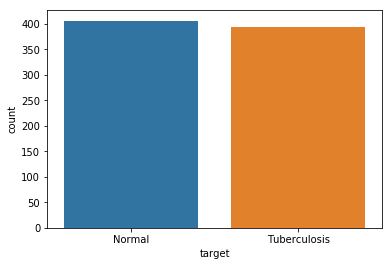

In [29]:
sns.countplot(df_data["target"])

In [30]:
# train_test_split

y = df_data['labels']

df_train, df_val = train_test_split(df_data, test_size=0.15, random_state=101,stratify=y)

print(df_train.shape)
print(df_val.shape)

(680, 8)
(120, 8)


In [31]:
df_data["target"].value_counts()

Normal          406
Tuberculosis    394
Name: target, dtype: int64

In [32]:
df_train['target'].value_counts()

Normal          345
Tuberculosis    335
Name: target, dtype: int64

In [33]:
df_val["target"].value_counts()

Normal          61
Tuberculosis    59
Name: target, dtype: int64

In [34]:
# Create a new directory
base_dir = 'base_dir'
os.mkdir(base_dir)

In [35]:
train_dir = os.path.join(base_dir, 'train_dir')
os.mkdir(train_dir)

# val_dir
val_dir = os.path.join(base_dir, 'val_dir')
os.mkdir(val_dir)

In [36]:
# create new folders inside train_dir
Normal = os.path.join(train_dir, 'Normal')
os.mkdir(Normal)
Tuberculosis = os.path.join(train_dir, 'Tuberculosis')
os.mkdir(Tuberculosis)


# create new folders inside val_dir
Normal = os.path.join(val_dir, 'Normal')
os.mkdir(Normal)
Tuberculosis = os.path.join(val_dir, 'Tuberculosis')
os.mkdir(Tuberculosis)

In [37]:
df_data.head()

,image_id,target,w,h,c,max_pixel_val,min_pixel_val,labels
37,CHNCXR_0038_0.png,Normal,3000,2744,3,255,0,0
789,MCUCXR_0354_1.png,Tuberculosis,4020,4892,3,252,0,1
782,MCUCXR_0316_1.png,Tuberculosis,4892,4020,3,255,0,1
641,CHNCXR_0642_1.png,Tuberculosis,2568,2110,3,255,0,1
582,CHNCXR_0583_1.png,Tuberculosis,2977,2996,3,255,0,1


In [39]:
# check how many train images we have in each folder

print(len(os.listdir('base_dir/train_dir/Normal')))
print(len(os.listdir('base_dir/train_dir/Tuberculosis')))

345
335


In [40]:
# check how many val images we have in each folder

print(len(os.listdir('base_dir/val_dir/Normal')))
print(len(os.listdir('base_dir/val_dir/Tuberculosis')))

61
59


In [41]:
class_list = ['Normal','Tuberculosis']

for item in class_list:
    
    # We are creating temporary directories here because we delete these directories later.
    # create a base dir
    aug_dir = 'aug_dir'
    os.mkdir(aug_dir)
    # create a dir within the base dir to store images of the same class
    img_dir = os.path.join(aug_dir, 'img_dir')
    os.mkdir(img_dir)

    # Choose a class
    img_class = item

    # list all images in that directory
    img_list = os.listdir('base_dir/train_dir/' + img_class)

    # Copy images from the class train dir to the img_dir e.g. class 'Normal'
    for fname in img_list:
            # source path to image
            src = os.path.join('base_dir/train_dir/' + img_class, fname)
            # destination path to image
            dst = os.path.join(img_dir, fname)
            # copy the image from the source to the destination
            shutil.copyfile(src, dst)


    # point to a dir containing the images and not to the images themselves
    path = aug_dir
    save_path = 'base_dir/train_dir/' + img_class

    # Create a data generator
    datagen = ImageDataGenerator(
        rotation_range=10,
        width_shift_range=0.1,
        height_shift_range=0.1,
        zoom_range=0.1,
        horizontal_flip=True,
        fill_mode='nearest')

    batch_size = 50

    aug_datagen = datagen.flow_from_directory(path,
                                           save_to_dir=save_path,
                                           save_format='png',
                                                    target_size=(IMAGE_HEIGHT,IMAGE_WIDTH),
                                                    batch_size=batch_size)
    
    
    # Generate the augmented images and add them to the training folders
    
    
    num_files = len(os.listdir(img_dir))
    
    # this creates a similar amount of images for each class
    num_batches = int(np.ceil((NUM_AUG_IMAGES_WANTED-num_files)/batch_size))

    # run the generator and create augmented images
    for i in range(0,num_batches):

        imgs, labels = next(aug_datagen)
        
    # delete temporary directory with the raw image files
    shutil.rmtree('aug_dir')

Found 345 images belonging to 1 classes.
Found 335 images belonging to 1 classes.


In [42]:
# This is the original images plus the augmented images.

print(len(os.listdir('base_dir/train_dir/Normal')))
print(len(os.listdir('base_dir/train_dir/Tuberculosis')))

1035
1005


In [43]:
# Check how many val images we have in each folder.

print(len(os.listdir('base_dir/val_dir/Normal')))
print(len(os.listdir('base_dir/val_dir/Tuberculosis')))

61
59


In [44]:
# plots images with labels within jupyter notebook
def plots(ims, figsize=(20,10), rows=5, interp=False, titles=None): # 12,6
    if type(ims[0]) is np.ndarray:
        ims = np.array(ims).astype(np.uint8)
        if (ims.shape[-1] != 3):
            ims = ims.transpose((0,2,3,1))
    f = plt.figure(figsize=figsize)
    cols = len(ims)//rows if len(ims) % 2 == 0 else len(ims)//rows + 1
    for i in range(len(ims)):
        sp = f.add_subplot(rows, cols, i+1)
        sp.axis('Off')
        if titles is not None:
            sp.set_title(titles[i], fontsize=16)
        plt.imshow(ims[i], interpolation=None if interp else 'none')


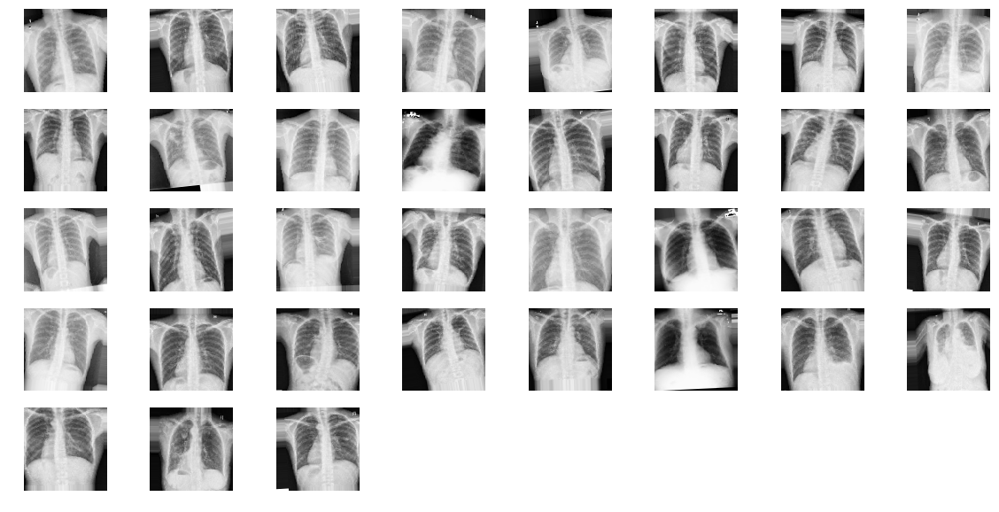

In [45]:
plots(imgs, titles=None)

In [46]:
train_path = 'base_dir/train_dir'
valid_path = 'base_dir/val_dir'

num_train_samples = len(df_train)
num_val_samples = len(df_val)
train_batch_size = 10
val_batch_size = 10


train_steps = np.ceil(num_train_samples / train_batch_size)
val_steps = np.ceil(num_val_samples / val_batch_size)

In [47]:
datagen = ImageDataGenerator(rescale=1.0/255)

train_gen = datagen.flow_from_directory(train_path,
                                        target_size=(IMAGE_HEIGHT,IMAGE_WIDTH),
                                        batch_size=train_batch_size,
                                        class_mode='categorical')

val_gen = datagen.flow_from_directory(valid_path,
                                        target_size=(IMAGE_HEIGHT,IMAGE_WIDTH),
                                        batch_size=val_batch_size,
                                        class_mode='categorical')

# Note: shuffle=False causes the test dataset to not be shuffled
test_gen = datagen.flow_from_directory(valid_path,
                                        target_size=(IMAGE_HEIGHT,IMAGE_WIDTH),
                                        batch_size=val_batch_size,
                                        class_mode='categorical',
                                        shuffle=False)

Found 2040 images belonging to 2 classes.
Found 120 images belonging to 2 classes.
Found 120 images belonging to 2 classes.


In [48]:
from keras.utils.vis_utils import plot_model

kernel_size = (3,3)
pool_size= (2,2)
first_filters = 32
second_filters = 128
third_filters = 128


dropout_conv = 0.3
dropout_dense = 0.3


model = Sequential()
model.add(Conv2D(first_filters, kernel_size, activation = 'relu', 
                 input_shape = (IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
model.add(Conv2D(first_filters, kernel_size, activation = 'relu'))
model.add(Conv2D(first_filters, kernel_size, activation = 'relu'))
model.add(MaxPooling2D(pool_size = pool_size)) 
model.add(Dropout(dropout_conv))

model.add(Conv2D(second_filters, kernel_size, activation ='relu'))
model.add(Conv2D(second_filters, kernel_size, activation ='relu'))
model.add(Conv2D(second_filters, kernel_size, activation ='relu'))
model.add(MaxPooling2D(pool_size = pool_size))
model.add(Dropout(dropout_conv))

model.add(Conv2D(third_filters, kernel_size, activation ='relu'))
model.add(Conv2D(third_filters, kernel_size, activation ='relu'))
model.add(Conv2D(third_filters, kernel_size, activation ='relu'))
model.add(MaxPooling2D(pool_size = pool_size))
model.add(Dropout(dropout_conv))

model.add(Flatten())
model.add(Dense(256, activation = "relu"))
model.add(Dropout(dropout_dense))
model.add(Dense(2, activation = "softmax"))

model.summary()

# plot the model
plot_model(model, to_file='TB_CNN_plot.png', show_shapes=True, show_layer_names=True)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 94, 94, 32)        896       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 92, 92, 32)        9248      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 90, 90, 32)        9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 45, 45, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 45, 45, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 43, 43, 128)       36992     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 41, 41, 128)       147584    
__________

In [49]:
model.compile(Adam(lr=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# CNN Model

In [50]:
filepath = "model.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, 
                             save_best_only=True, mode='max')

reduce_lr = ReduceLROnPlateau(monitor='val_acc', factor=0.5, patience=2, 
                                   verbose=1, mode='max', min_lr=0.00001)
                              
                              
callbacks_list = [checkpoint, reduce_lr]

history = model.fit_generator(train_gen, steps_per_epoch=train_steps, 
                            validation_data=val_gen,
                            validation_steps=val_steps,
                            epochs=100, verbose=1,
                           callbacks=callbacks_list)

Epoch 1/100
67/68 [============================>.] - ETA: 2s - loss: 0.6942 - acc: 0.5164
Epoch 00001: val_acc improved from -inf to 0.50833, saving model to model.h5
68/68 [==============================] - 176s 3s/step - loss: 0.6944 - acc: 0.5132 - val_loss: 0.6931 - val_acc: 0.5083
Epoch 2/100
67/68 [============================>.] - ETA: 1s - loss: 0.6937 - acc: 0.5179
Epoch 00002: val_acc did not improve from 0.50833
68/68 [==============================] - 150s 2s/step - loss: 0.6937 - acc: 0.5162 - val_loss: 0.6930 - val_acc: 0.5083
Epoch 3/100
67/68 [============================>.] - ETA: 1s - loss: 0.6923 - acc: 0.5373
Epoch 00003: val_acc did not improve from 0.50833

Epoch 00003: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
68/68 [==============================] - 155s 2s/step - loss: 0.6924 - acc: 0.5353 - val_loss: 0.6930 - val_acc: 0.5083
Epoch 4/100
67/68 [============================>.] - ETA: 1s - loss: 0.6922 - acc: 0.5075
Epoch 00004: val_acc i

Epoch 31/100
67/68 [============================>.] - ETA: 1s - loss: 0.4889 - acc: 0.7687
Epoch 00031: val_acc did not improve from 0.74167
68/68 [==============================] - 148s 2s/step - loss: 0.4895 - acc: 0.7676 - val_loss: 0.5352 - val_acc: 0.7250
Epoch 32/100
67/68 [============================>.] - ETA: 1s - loss: 0.4815 - acc: 0.7716
Epoch 00032: val_acc did not improve from 0.74167
68/68 [==============================] - 154s 2s/step - loss: 0.4822 - acc: 0.7721 - val_loss: 0.5479 - val_acc: 0.7333
Epoch 33/100
67/68 [============================>.] - ETA: 1s - loss: 0.5133 - acc: 0.7418
Epoch 00033: val_acc did not improve from 0.74167
68/68 [==============================] - 156s 2s/step - loss: 0.5146 - acc: 0.7412 - val_loss: 0.5333 - val_acc: 0.7333
Epoch 34/100
67/68 [============================>.] - ETA: 1s - loss: 0.5261 - acc: 0.7731
Epoch 00034: val_acc did not improve from 0.74167
68/68 [==============================] - 146s 2s/step - loss: 0.5325 - acc: 

67/68 [============================>.] - ETA: 1s - loss: 0.4763 - acc: 0.7716
Epoch 00062: val_acc improved from 0.77500 to 0.77500, saving model to model.h5
68/68 [==============================] - 146s 2s/step - loss: 0.4780 - acc: 0.7691 - val_loss: 0.5184 - val_acc: 0.7750
Epoch 63/100
67/68 [============================>.] - ETA: 1s - loss: 0.4821 - acc: 0.7776
Epoch 00063: val_acc did not improve from 0.77500
68/68 [==============================] - 150s 2s/step - loss: 0.4834 - acc: 0.7765 - val_loss: 0.5246 - val_acc: 0.7750
Epoch 64/100
67/68 [============================>.] - ETA: 1s - loss: 0.4791 - acc: 0.7851
Epoch 00064: val_acc did not improve from 0.77500
68/68 [==============================] - 146s 2s/step - loss: 0.4767 - acc: 0.7868 - val_loss: 0.5100 - val_acc: 0.7583
Epoch 65/100
67/68 [============================>.] - ETA: 1s - loss: 0.4714 - acc: 0.7806
Epoch 00065: val_acc did not improve from 0.77500
68/68 [==============================] - 148s 2s/step - los

Epoch 93/100
67/68 [============================>.] - ETA: 1s - loss: 0.4559 - acc: 0.7896
Epoch 00093: val_acc did not improve from 0.80000
68/68 [==============================] - 152s 2s/step - loss: 0.4590 - acc: 0.7868 - val_loss: 0.5221 - val_acc: 0.7583
Epoch 94/100
67/68 [============================>.] - ETA: 1s - loss: 0.4446 - acc: 0.7940
Epoch 00094: val_acc did not improve from 0.80000
68/68 [==============================] - 147s 2s/step - loss: 0.4436 - acc: 0.7941 - val_loss: 0.5214 - val_acc: 0.7667
Epoch 95/100
67/68 [============================>.] - ETA: 1s - loss: 0.4424 - acc: 0.7881
Epoch 00095: val_acc improved from 0.80000 to 0.80833, saving model to model.h5
68/68 [==============================] - 149s 2s/step - loss: 0.4421 - acc: 0.7882 - val_loss: 0.5213 - val_acc: 0.8083
Epoch 96/100
67/68 [============================>.] - ETA: 1s - loss: 0.4870 - acc: 0.7731
Epoch 00096: val_acc did not improve from 0.80833
68/68 [==============================] - 150s 

In [51]:
# get the metric names so we can use evaulate_generator
model.metrics_names

['loss', 'acc']

In [52]:
# Here the best epoch will be used.

model.load_weights('model.h5')

val_loss, val_acc = \
model.evaluate_generator(test_gen, 
                        steps=val_steps)

print('val_loss:', val_loss)
print('val_acc:', val_acc)

val_loss: 0.5212791164716085
val_acc: 0.8083333348234495


<Figure size 432x288 with 0 Axes>

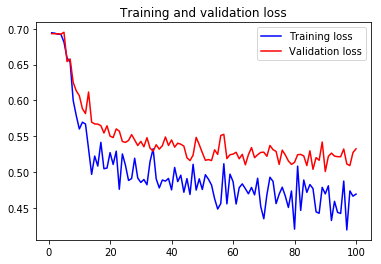

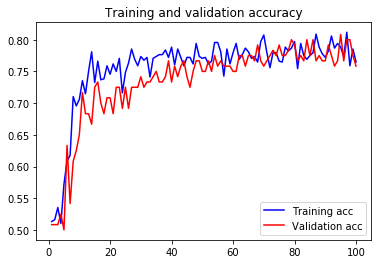

<Figure size 432x288 with 0 Axes>

In [80]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.figure()

plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

In [56]:
# Get the labels of the test images.

test_labels = test_gen.classes


In [57]:
# We need these to plot the confusion matrix.
test_labels


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [58]:
# Print the label associated with each class
test_gen.class_indices

{'Normal': 0, 'Tuberculosis': 1}

In [59]:
# make a prediction
predictions = model.predict_generator(test_gen, steps=val_steps, verbose=1)

12/12 [==============================] - 26s 2s/step


In [66]:
predictions.shape

(120, 2)

In [61]:
test_labels.shape

(120,)

In [75]:
cm = confusion_matrix(test_labels, predictions.argmax(axis = 1))

In [76]:
test_gen.class_indices

{'Normal': 0, 'Tuberculosis': 1}

Confusion matrix, without normalization
[[55  6]
 [17 42]]


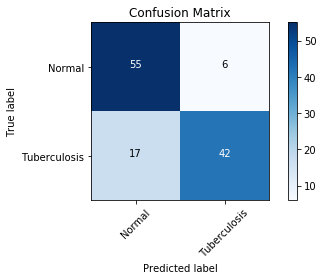

In [77]:
cm_plot_labels = ["Normal" , "Tuberculosis"]
plot_confusion_matrix(cm, cm_plot_labels, title = "Confusion Matrix")

In [78]:
# Get the filenames, labels and associated predictions

# This outputs the sequence in which the generator processed the test images
test_filenames = test_gen.filenames

# Get the true labels
y_true = test_gen.classes

# Get the predicted labels
y_pred = predictions.argmax(axis=1)

In [79]:
from sklearn.metrics import classification_report

# Generate a classification report

report = classification_report(y_true, y_pred, target_names=cm_plot_labels)

print(report)

              precision    recall  f1-score   support

      Normal       0.76      0.90      0.83        61
Tuberculosis       0.88      0.71      0.79        59

 avg / total       0.82      0.81      0.81       120

